In [1]:
import os 
import pandas as pd
import numpy as np
from results_utils import build_results_csv, get_results_by_param_by_algo, plot_results_by_param_by_algo, get_results_2d, plot_results_2d, build_exec_time_csv,get_results_fixed_motifs_var_length_by_algo,plot_exec_time_fixed_motifs_var_length,extract_scores, build_fscore_by_ts

## RQ1 : Real data results

### Construct score table

In [2]:
general_path=os.getcwd()+'/RQ1/'
dataset_list=['arm-CODA','mitdb','mitdb1','ptt-ppg','REFIT','SIGN','JIGSAWSMaster','JIGSAWSSlave']
write_results_path=os.getcwd()+'/results_summary/RQ1/'
algos_list=['MatrixProfile','PanMatrixProfile','LocoMotif','LatentMotif','MDL','Motiflets','BasePersistentPattern','Valmod','Baseline','AdaptativeBasePersistentPattern','Grammarviz','Motiflets_numba']
for alpha in [0.25,0.5,0.75]:
    df = build_results_csv(general_path,write_results_path,dataset_list,algos_list,alpha=alpha)

### Critical diagrams (by time series result)


In [3]:
datasets=['arm-CODA','mitdb','mitdb1','ptt-ppg','JIGSAWSMaster','JIGSAWSSlave','REFIT','SIGN']
algos_list=['MatrixProfile','PanMatrixProfile','Valmod','Motiflets','BasePersistentPattern','AdaptativeBasePersistentPattern','LocoMotif','MDL','Grammarviz','LatentMotif','Baseline']
build_fscore_by_ts(datasets,algos_list)

#### With REFIT and SIGN:

/Users/valerio/anaconda3/lib/python3.10/site-packages/aeon/base/__init__.py:24: FutureWarning: The aeon package will soon be releasing v1.0.0 with the removal of legacy modules and interfaces such as BaseTransformer and BaseForecaster. This will contain breaking changes. See aeon-toolkit.org for more information. Set aeon.AEON_DEPRECATION_WARNING or the AEON_DEPRECATION_WARNING environmental variable to 'False' to disable this warning.
  warnings.warn(


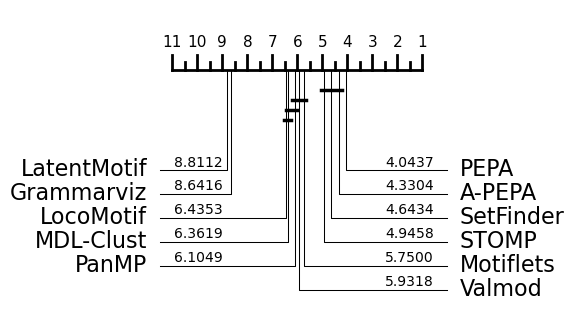

In [4]:
algos_list=['STOMP','PanMP','Valmod','Motiflets','PEPA','A-PEPA','LocoMotif','MDL-Clust','Grammarviz','LatentMotif','SetFinder']
all_scores=[]

df = pd.read_csv('RQ1/results_by_ts.csv')
for i in range(len(df)):
    scores=df.iloc[i].to_numpy()[2:]
    scores+=0.01*np.random.uniform(size=scores.shape)
    #break ties without adding bias 
    all_scores.append(scores)

all_scores=np.array(all_scores)
from aeon.visualisation import plot_critical_difference

plot = plot_critical_difference(all_scores,algos_list,width=5)

#### Without REFIT and SIGN:

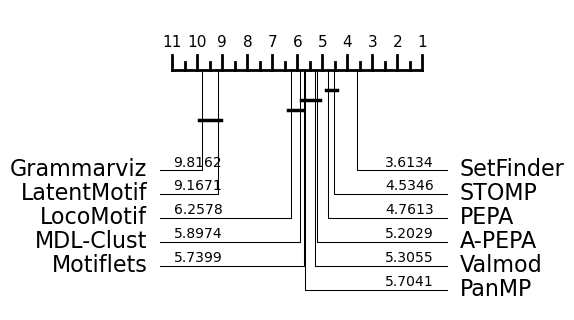

In [5]:
algos_list=['STOMP','PanMP','Valmod','Motiflets','PEPA','A-PEPA','LocoMotif','MDL-Clust','Grammarviz','LatentMotif','SetFinder']
all_scores=[]

df = pd.read_csv('RQ1/results_by_ts.csv')
#difference here:
for i in range(419):
    scores=df.iloc[i].to_numpy()[2:]
    scores+=0.01*np.random.uniform(size=scores.shape)
    #break ties without adding bias 
    all_scores.append(scores)

all_scores=np.array(all_scores)
from aeon.visualisation import plot_critical_difference

plot = plot_critical_difference(all_scores,algos_list,width=5)

## RQ2: 

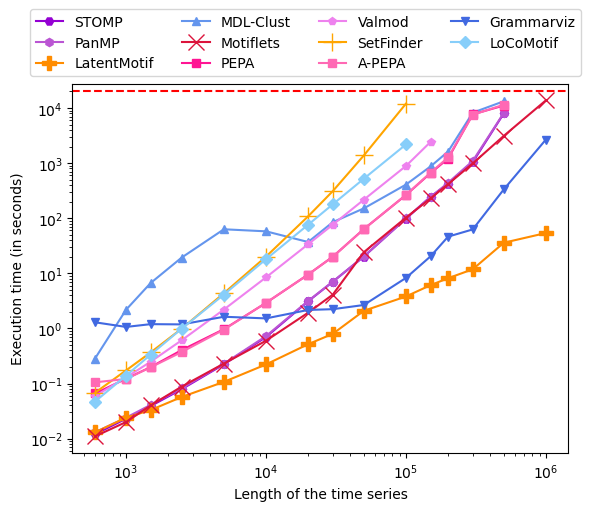

In [7]:
algos_list=['MatrixProfile','PanMatrixProfile','LatentMotif','MDL','Motiflets_numba','BasePersistentPattern','Valmod','Baseline','AdaptativeBasePersistentPattern','Grammarviz','LocoMotif']

general_path=os.getcwd()+'/RQ2/'
exact_ts_length_list=[600,1000,1500,2500,5000,10000,20000,30000,50000,100000,150000,200000,300000,500000,1000000]
dataset_list=['exact_ts_length_'+str(i) for i in exact_ts_length_list]
write_results_path=os.getcwd()+'/results_summary/RQ2/'
#we remove the first iterations for Motiflets and LocoMotif since they correspond to the numba compilation 
numba_file=general_path+'exact_ts_length_600/Infos/Motiflets_numba/Motiflets_numba_repetition_0.json'
locomotif_file=general_path+'exact_ts_length_600/Infos/LocoMotif/LocoMotif_repetition_0.json'
if os.path.exists(numba_file):
    os.remove(numba_file)
if os.path.exists(locomotif_file):
    os.remove(locomotif_file)
df=build_exec_time_csv(general_path,write_results_path,dataset_list,algos_list)
results_dict,metrics=get_results_fixed_motifs_var_length_by_algo(write_results_path,exact_ts_length_list)
plot_exec_time_fixed_motifs_var_length(results_dict,exact_ts_length_list)

## RQ3: Number of motifs

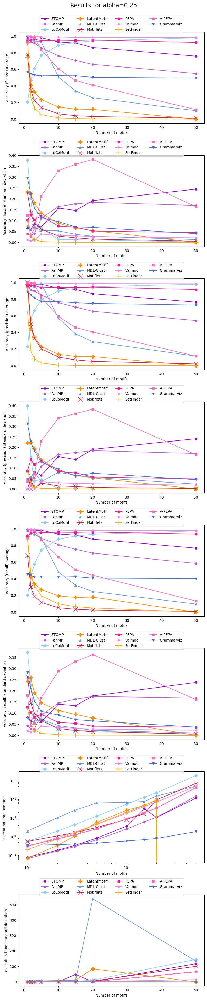

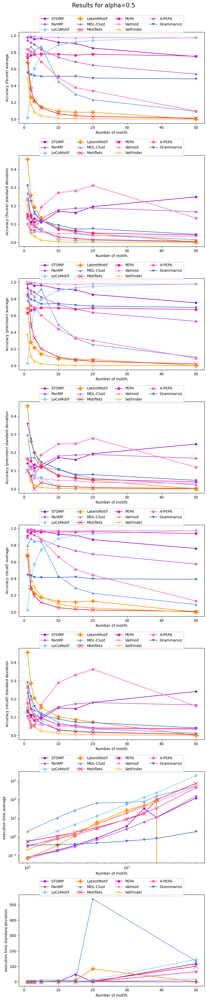

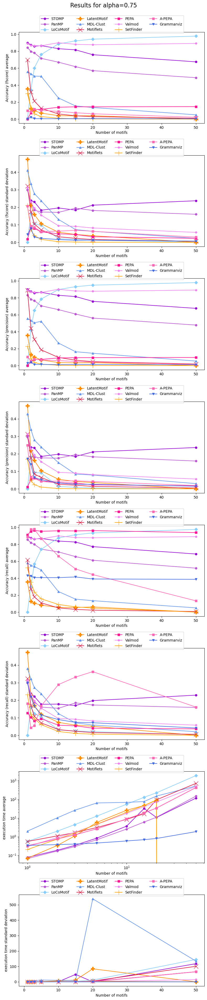

In [7]:
algos_list=['MatrixProfile','PanMatrixProfile','LocoMotif','LatentMotif','MDL','Motiflets','BasePersistentPattern','Valmod','Baseline','AdaptativeBasePersistentPattern','Grammarviz']

general_path=os.getcwd()+'/RQ3/'
n_motifs_list=[1,2,3,5,10,15,20,50]
dataset_list=['n_motifs_'+str(i) for i in n_motifs_list]
write_results_path=os.getcwd()+'/results_summary/RQ3/'
for alpha in [0.25,0.5,0.75]:
    df=build_results_csv(general_path,write_results_path,dataset_list,algos_list,alpha=alpha)
    results_dict,metrics=get_results_by_param_by_algo(write_results_path,n_motifs_list,'n_motifs',alpha=alpha)
    plot_results_by_param_by_algo(results_dict,n_motifs_list,'Number of motifs',metrics,alpha=alpha)

## RQ4: Motifs cardinality

### RQ4.1 :

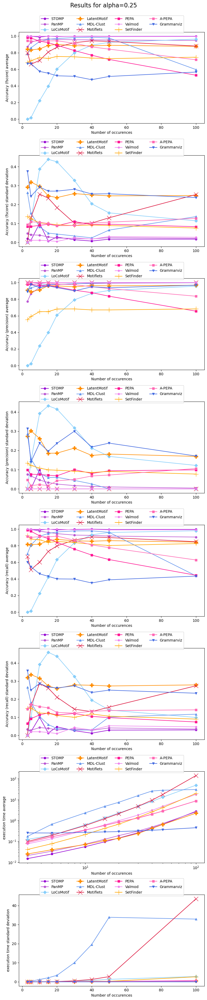

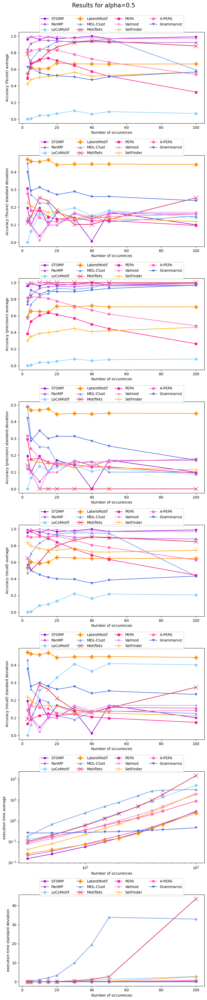

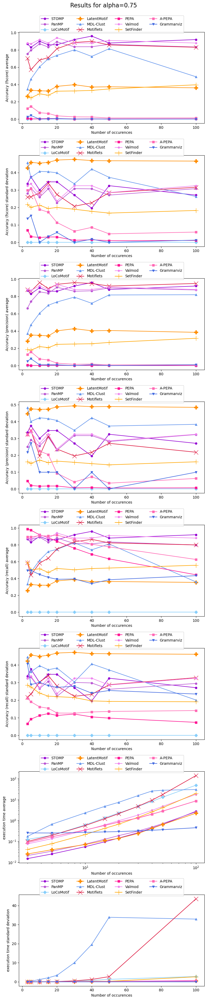

In [6]:
general_path=os.getcwd()+'/RQ4/scenario1/'
n_occurences_list=[3,5,10,15,20,30,40,50,100]
dataset_list=['n_occurences_'+str(i) for i in n_occurences_list]
write_results_path=os.getcwd()+'/results_summary/RQ4/scenario1/'
for alpha in [0.25,0.5,0.75]:
    df=build_results_csv(general_path,write_results_path,dataset_list,algos_list,alpha=alpha)
    results_dict,metrics=get_results_by_param_by_algo(write_results_path,n_occurences_list,'n_occurences',alpha=alpha)
    plot_results_by_param_by_algo(results_dict,n_occurences_list,'Number of occurences',metrics,alpha=alpha)

### RQ4.2:

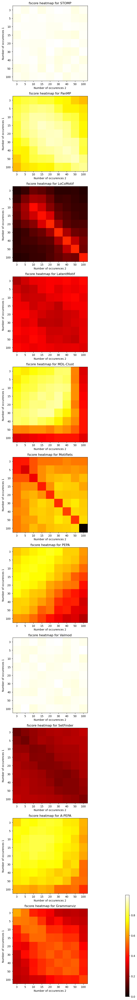

In [3]:
general_path=os.getcwd()+'/RQ4/scenario2/'
n_occurences_list=[3,5,10,15,20,30,40,50,100]
dataset_list=[]
for i in n_occurences_list:
    for j in n_occurences_list:
        if i<=j:
            dataset_list.append('motifs_occurences_'+str(i)+'and'+str(j))
write_results_path=os.getcwd()+'/results_summary/RQ4/scenario2/'
df=build_results_csv(general_path,write_results_path,dataset_list,algos_list)
results_dict,metrics=get_results_2d(write_results_path,n_occurences_list,'motifs_occurences')
metric=metrics[0]
plot_results_2d(results_dict, n_occurences_list, "Number of occurences",  metric)

## RQ5.1 : Temporal deformations

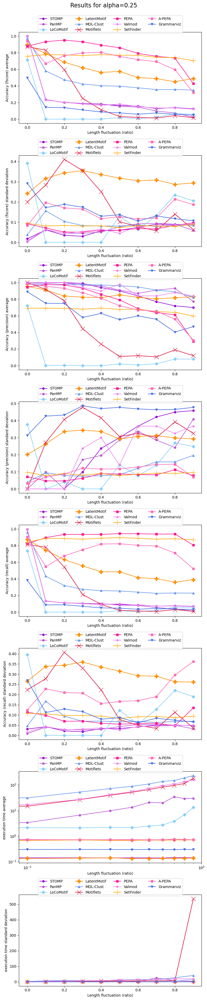

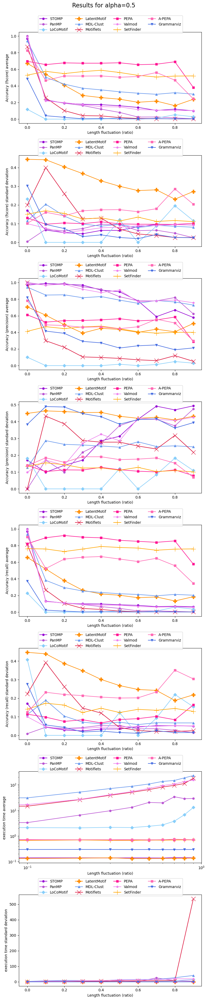

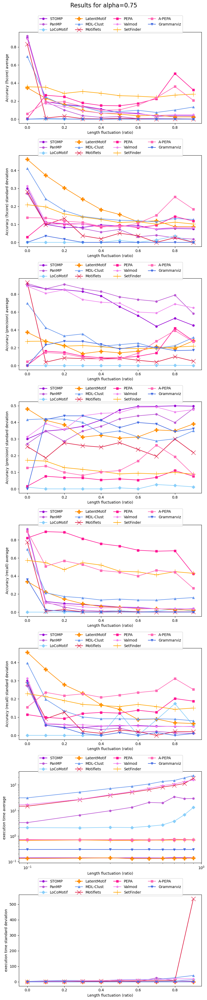

In [4]:
general_path=os.getcwd()+'/RQ5/scenario1/'
length_fluctuations=[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
dataset_list=['length_fluctuation_'+str(i) for i in length_fluctuations]
write_results_path=os.getcwd()+'/results_summary/RQ5/scenario1/'
for alpha in [0.25,0.5,0.75]:
    df=build_results_csv(general_path,write_results_path,dataset_list,algos_list,alpha=alpha)
    results_dict,metrics=get_results_by_param_by_algo(write_results_path,length_fluctuations,'length_fluctuation',alpha=alpha)
    plot_results_by_param_by_algo(results_dict,length_fluctuations,'Length fluctuation (ratio)',metrics,alpha=alpha)

## RQ5.2: Different time scales

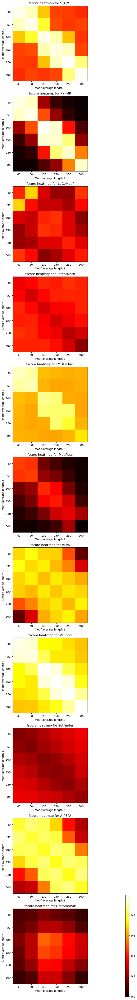

In [2]:
general_path=os.getcwd()+'/RQ5/scenario2/'
lengths_list=[40,50,100,150,250,500]
dataset_list=[]
for i in lengths_list:
    for j in lengths_list:
        if i<=j:
            dataset_list.append('motifs_lengths_'+str(i)+'and'+str(j))
write_results_path=os.getcwd()+'/results_summary/RQ5/scenario2/'
df=build_results_csv(general_path,write_results_path,dataset_list,algos_list)
results_dict,metrics=get_results_2d(write_results_path,lengths_list,'motifs_lengths')
metric=metrics[0]
plot_results_2d(results_dict, lengths_list, "Motif average length",  metric)

## RQ6.1: Walk amplitude

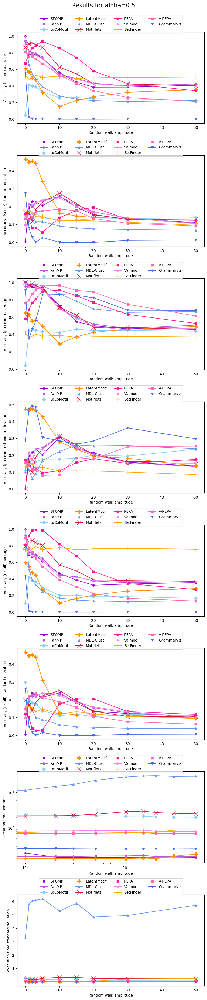

In [5]:
general_path=os.getcwd()+'/RQ6/scenario1/'
walk_amplitude_list=[0,1,2,3,5,10,15,20,30,50]
dataset_list=['walk_amplitude_'+str(i) for i in walk_amplitude_list]
write_results_path=os.getcwd()+'/results_summary/RQ6/scenario1/'

df=build_results_csv(general_path,write_results_path,dataset_list,algos_list)
results_dict,metrics=get_results_by_param_by_algo(write_results_path,walk_amplitude_list,'walk_amplitude')
plot_results_by_param_by_algo(results_dict,walk_amplitude_list,'Random walk amplitude',metrics)

## RQ6.2: Noise sensitivity

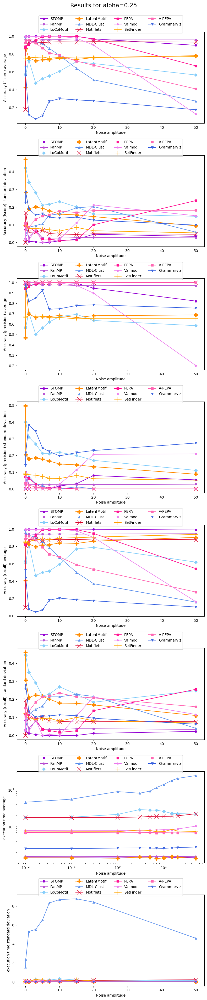

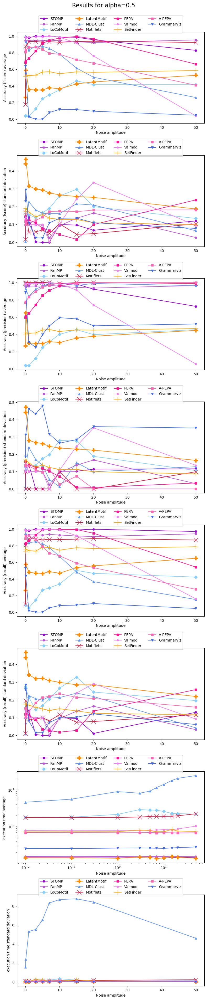

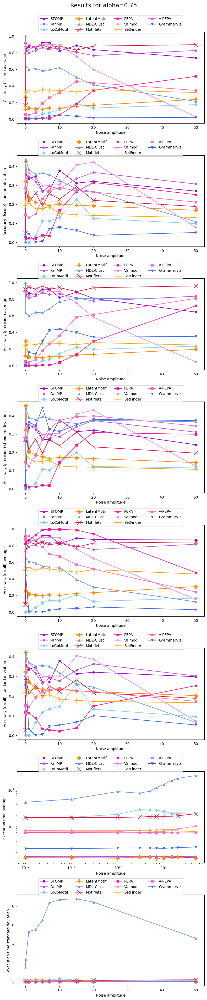

In [6]:
general_path=os.getcwd()+'/RQ6/scenario2/'
noise_amplitude_list=[0.01,0.1,1,3,5,7,10,15,20,50]
dataset_list=['noise_amplitude_'+str(i) for i in noise_amplitude_list]
write_results_path=os.getcwd()+'/results_summary/RQ6/scenario2/'
for alpha in [0.25,0.5,0.75]:
    df=build_results_csv(general_path,write_results_path,dataset_list,algos_list,alpha=alpha)
    results_dict,metrics=get_results_by_param_by_algo(write_results_path,noise_amplitude_list,'noise_amplitude',alpha=alpha)
    plot_results_by_param_by_algo(results_dict,noise_amplitude_list,'Noise amplitude',metrics,alpha=alpha)